# Acadia library demonstration

In [1]:
import numpy as np
from IPython.display import Audio
import scipy.stats as st
from scipy.signal import square, sawtooth
import matplotlib.pyplot as plt

from acadia.shape import Shape
from acadia.histogram import Histogram

In [2]:
SR = 44100


## Periodic waveforms

### Square_wave

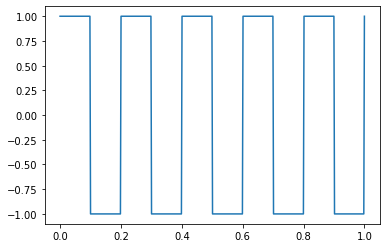

In [3]:
t = np.linspace(0, 1, 500)
square_wave  = square(2 * np.pi * 5 * t)
fig, ax = plt.subplots()
ax.plot(t, square_wave)
plt.show()

In [4]:
Audio(Shape(t, square_wave).values, rate=SR)

### Sawtooth-wave

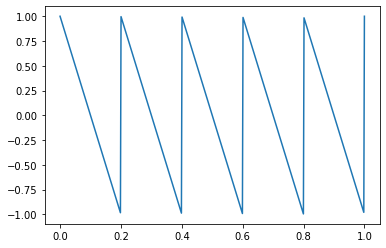

In [5]:
sawtooth_wave = sawtooth(2 * np.pi * 5 * t, width=0)
fig, ax = plt.subplots()
ax.plot(t, sawtooth_wave)
plt.show()

In [6]:
Audio(Shape(t, sawtooth_wave).values, rate=SR)

### Sine-wave

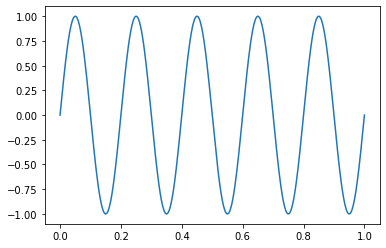

In [7]:
sine_wave = np.sin(2 * np.pi * 5 * t)
fig, ax = plt.subplots()
ax.plot(t, sine_wave)
plt.show()

In [8]:
Audio(Shape(t, sine_wave).values, rate=SR)

## Curves

### Parabola

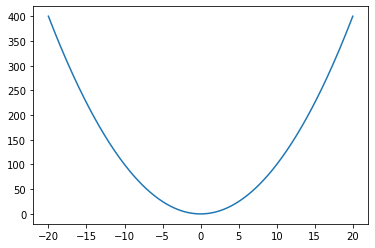

In [9]:
x = np.linspace(-20, 20, 300)
y = x**2
fig, ax = plt.subplots()
ax.plot(x, y)
plt.show()

In [10]:
Audio(Shape(x, y).values, rate=SR)

### Hyperbola

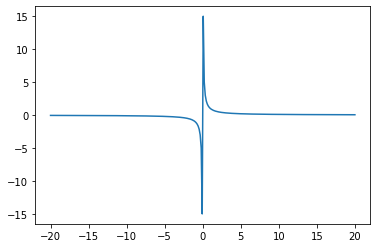

In [11]:
y = 1 / x
fig, ax = plt.subplots()
ax.plot(x, y)
plt.show()

In [12]:
Audio(Shape(x, y).values, rate=SR)

## Lines

### Rays

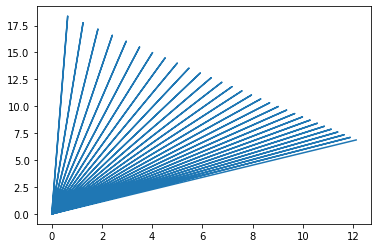

In [13]:
x = np.array([])
y = np.array([])
x_ = np.zeros(20)
y_ = np.linspace(0, 19, 20)
step = 30
fig, ax = plt.subplots()
for _ in range(step):
    x_ += y_ / step
    x = np.concatenate((x, x_))
    y_ -= y_ / step
    y = np.concatenate((y, y_))

ax.plot(x, y)

plt.show()

In [14]:
Audio(Shape(x, y).values, rate=SR)

### Bars

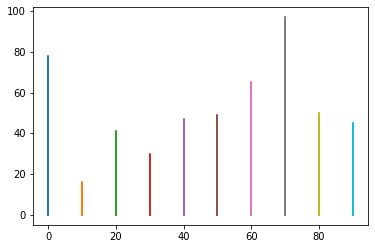

In [15]:
bars = Shape()
fig, ax = plt.subplots()
for i in np.arange(0, 100, 10):
    random_number =     np.random.randint(0, 100, 1)
    y = np.concatenate((np.arange(random_number), np.zeros((100 - random_number))))
    x = np.array([i] * len(y))
    bars.add(x, y)
    ax.plot(x, y)

plt.show()

In [16]:
Audio(bars.values, rate=SR)

## Distributions

### Normal

In [17]:
normal= st.norm()


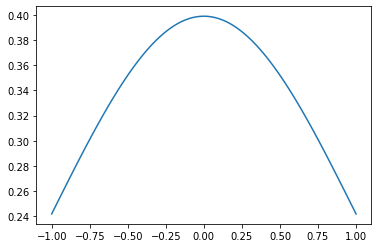

In [18]:
x = np.linspace(-1, 1, 100)
y = normal.pdf(x)
fig, ax = plt.subplots()
ax.plot(x, y)
plt.show()


In [19]:
Audio(Shape(x, y).values, rate=SR)


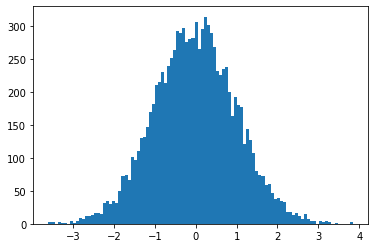

In [20]:
distr = normal.rvs(size=10000)
plt.hist(distr, bins=100)
plt.show()


In [21]:
hist_normal = Histogram(distr, density=True)
Audio(hist_normal.values, rate=SR)

### Poisson

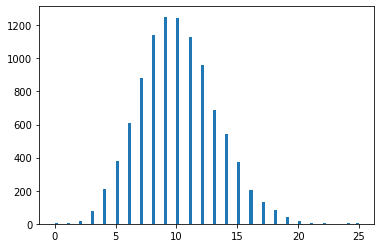

In [22]:
poisson = st.poisson(10)
distr = poisson.rvs(10000)
plt.hist(distr, bins=100)
plt.show()

In [23]:
hist_poisson = Histogram(distr)
Audio(hist_poisson.values, rate=SR)


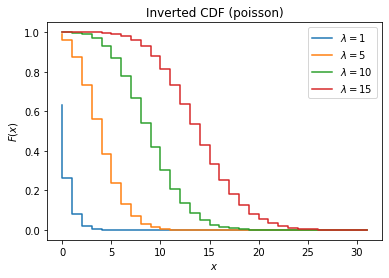

In [24]:
x = np.arange(32)
inv_cdf_shapes = Shape(mode='slow')
# For given intensity probability of that or higher frequency
for lambda_ in [1, 5, 10, 15]:
    rv = st.poisson(lambda_)
    inv_cdf = 1 - rv.cdf(x)
    inv_cdf_shapes.add(x, inv_cdf)
    plt.step(x, inv_cdf, label="$\lambda=%s$" % lambda_)
plt.legend()
plt.title("Inverted CDF (poisson)")
plt.ylabel('$F(x)$')
plt.xlabel('$x$')
plt.show()


In [25]:
Audio(inv_cdf_shapes.values, rate=SR)

### Uniform

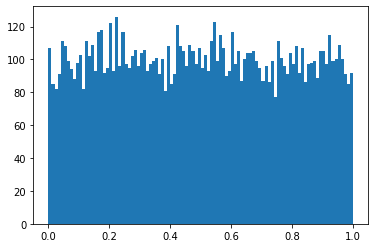

In [26]:
uniform= st.uniform()
distr = uniform.rvs(10000)
plt.hist(distr, bins=100)
plt.show()

In [27]:
hist_uniform = Histogram(distr)
Audio(hist_uniform.values, rate=SR)

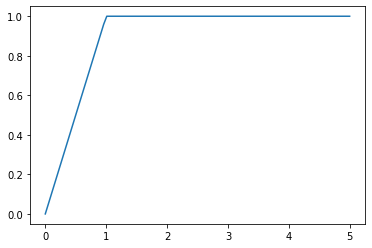

In [28]:
x = np.linspace(0, 5, 100)
cdf = uniform.cdf(x)
plt.plot(x, cdf)
plt.show()

In [29]:
Audio(Shape(x, cdf, 'slow').values, rate=SR)


### Chi2

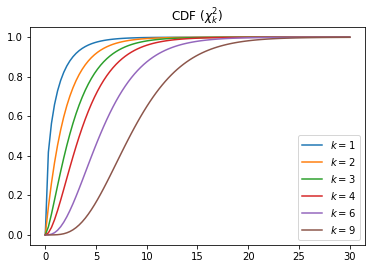

In [30]:
x = np.linspace(0,30,100)
cdf_shapes = Shape()
for k in [1, 2, 3, 4, 6, 9]:
    chi2 = st.chi2(k)
    cdf = chi2.cdf(x)
    cdf_shapes.add(x, cdf)
    plt.plot(x, cdf, label="$k=%s$" % k)
plt.legend()
plt.title("CDF ($\chi^2_k$)")
plt.show()

In [31]:
Audio(cdf_shapes.values, rate=SR)

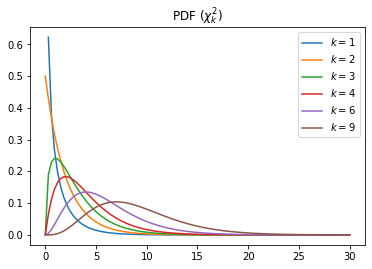

In [32]:
x = np.linspace(0, 30, 100)
pdf_shapes = Shape()
for k in [1, 2, 3, 4, 6, 9]:
    chi2 = st.chi2(k)
    pdf = chi2.pdf(x)
    pdf_shapes.add(x, pdf)
    plt.plot(x, pdf, label="$k=%s$" % k)
plt.legend()
plt.title("PDF ($\chi^2_k$)")
plt.show()


In [33]:
Audio(pdf_shapes.values, rate=SR)


C:\Users\monah\Downloads\accessibility_project\acadia\acadia\space.py:44: RuntimeWarning: invalid value encountered in true_divide
  return (values - values_min) / (values_max - values_min) * (max - min) + min
